In [1]:
import tensorflow as tf
import os, glob
import numpy as np
import matplotlib.pyplot as plt

from models import *

In [66]:
load_dir = 'data/w58y67_prepro/'

In [67]:
x_data = np.load('%s/x_test.npy'%(load_dir))
print('* data shape: ', x_data.shape)

* data shape:  (8761, 200, 48, 3)


In [68]:
encoder, decoder, vae = build_vae(x_data, 10)

In [69]:
vae.summary()

Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 200, 48, 3)]      0         
_________________________________________________________________
encoder (Model)              [(None, 10), (None, 10),  1319380   
_________________________________________________________________
decoder (Model)              (None, 200, 48, 3)        1321571   
Total params: 2,640,951
Trainable params: 2,640,951
Non-trainable params: 0
_________________________________________________________________


In [70]:
checkpoint = tf.train.Checkpoint(step=tf.Variable(1), encoder=encoder, decoder=decoder, vae=vae)
checkpoint.restore(tf.train.latest_checkpoint(load_dir+'/train_2/ckp/'))

In [71]:
x_test = x_data/255
x_pred = vae.predict(x_test)

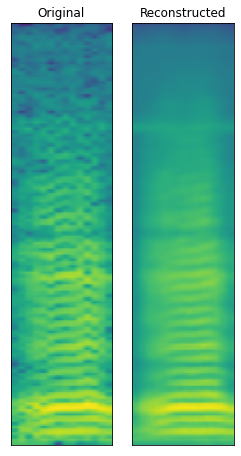

In [74]:
plot_rec(4)

In [75]:
latent = encoder.predict(x_test)[0]
latent.shape

(8761, 10)

In [87]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2)
#, perplexity=4, early_exaggeration=12.0,
#     learning_rate=20.0, n_iter=300, n_iter_without_progress=200,
#     min_grad_norm=1e-07, metric='euclidean', init='random', verbose=0,
#     random_state=None, method='barnes_hut', angle=0.5)
tsne_val = tsne.fit_transform(latent)

In [77]:
tsne_val.shape

(8761, 2)

In [85]:
save_path = load_dir+'train_2/'
save_path

'data/w58y67_prepro/train_2/'

-84.58057403564453 90.92176055908203 -81.04956817626953 77.2029037475586


<Figure size 432x288 with 0 Axes>

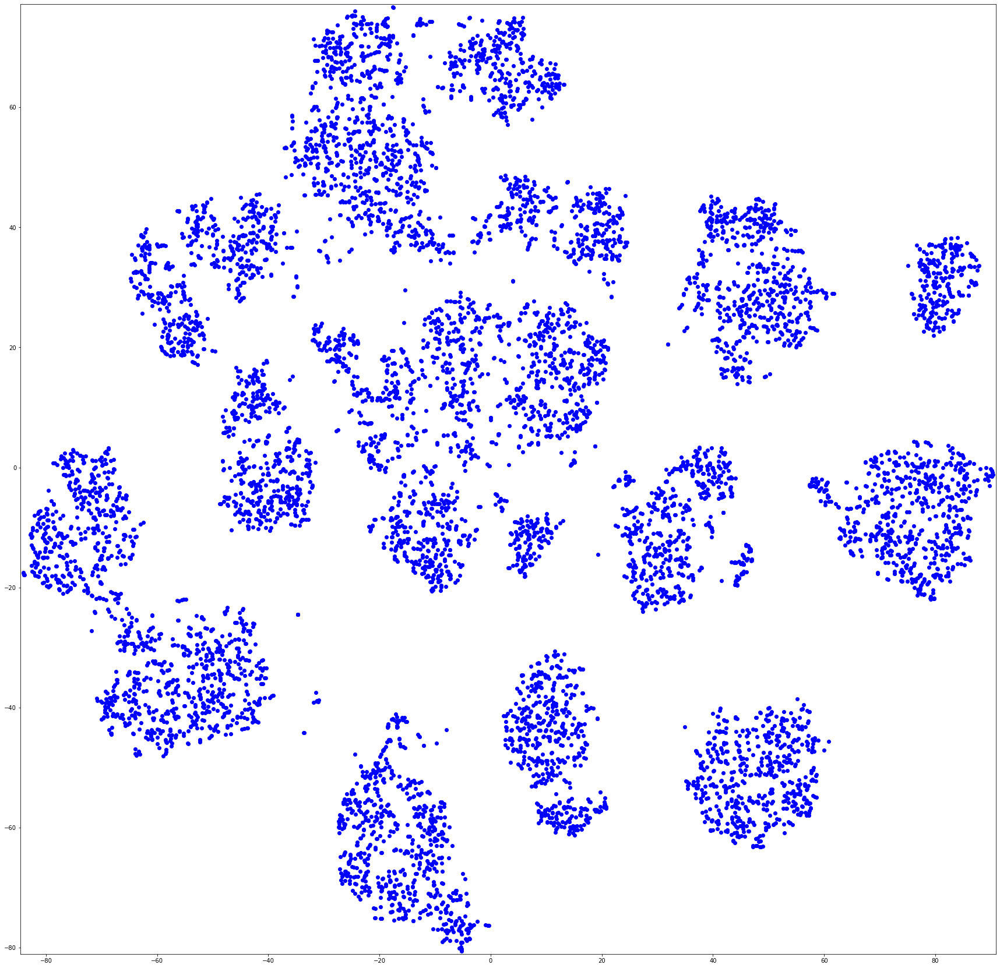

In [88]:
plot_scatter(tsne_val, save_path)

In [100]:
x = tsne_val[:,0]
y = tsne_val[:,1]
cond = 

def get_group(cond):
    cond = (cond)
    group = x_test[cond]
    return group

#g1_mask = ((tsne_val[:,1] < -40) & (tsne_val[:,0] > -30) & (tsne_val[:,0] < 0))
#g1 = x_test[g1_mask]
#g1.shape

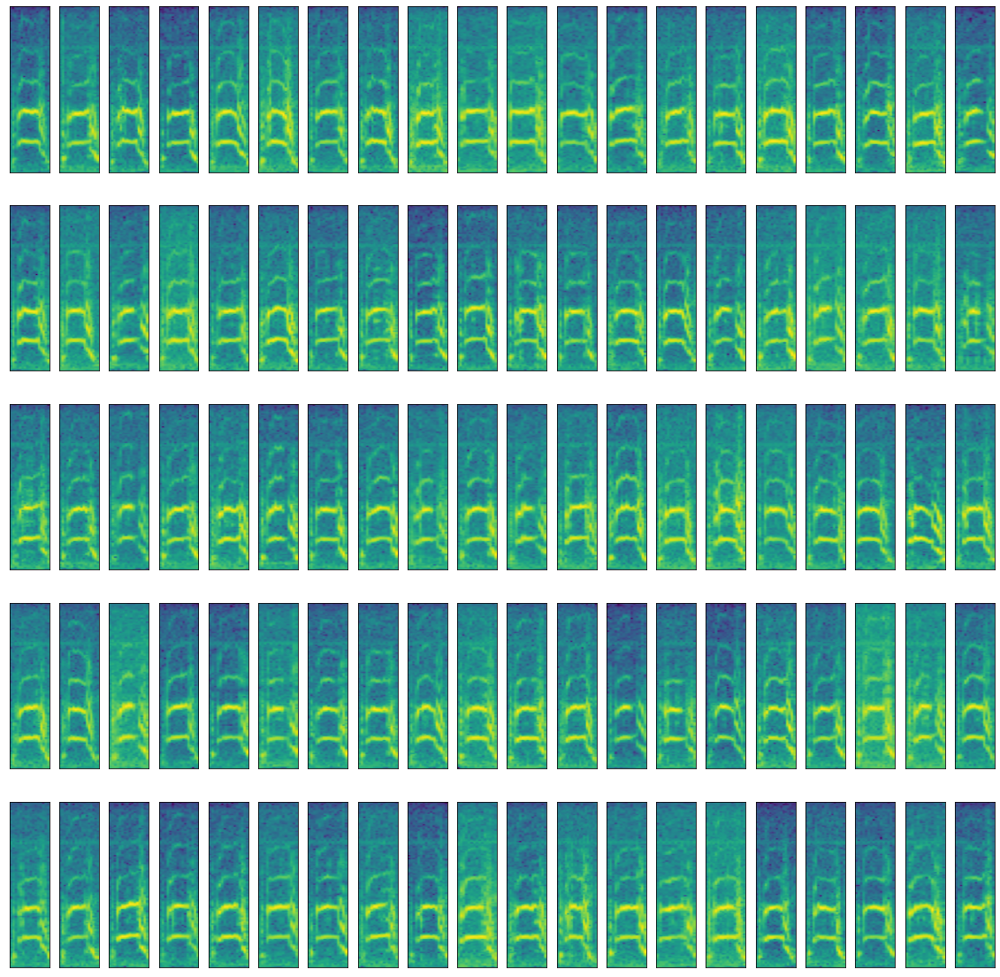

In [107]:
cond = (y<-40) & (x>-30) & (x<0)
g1 = get_group(cond)
plot_group(g1, save_path, 'g1')

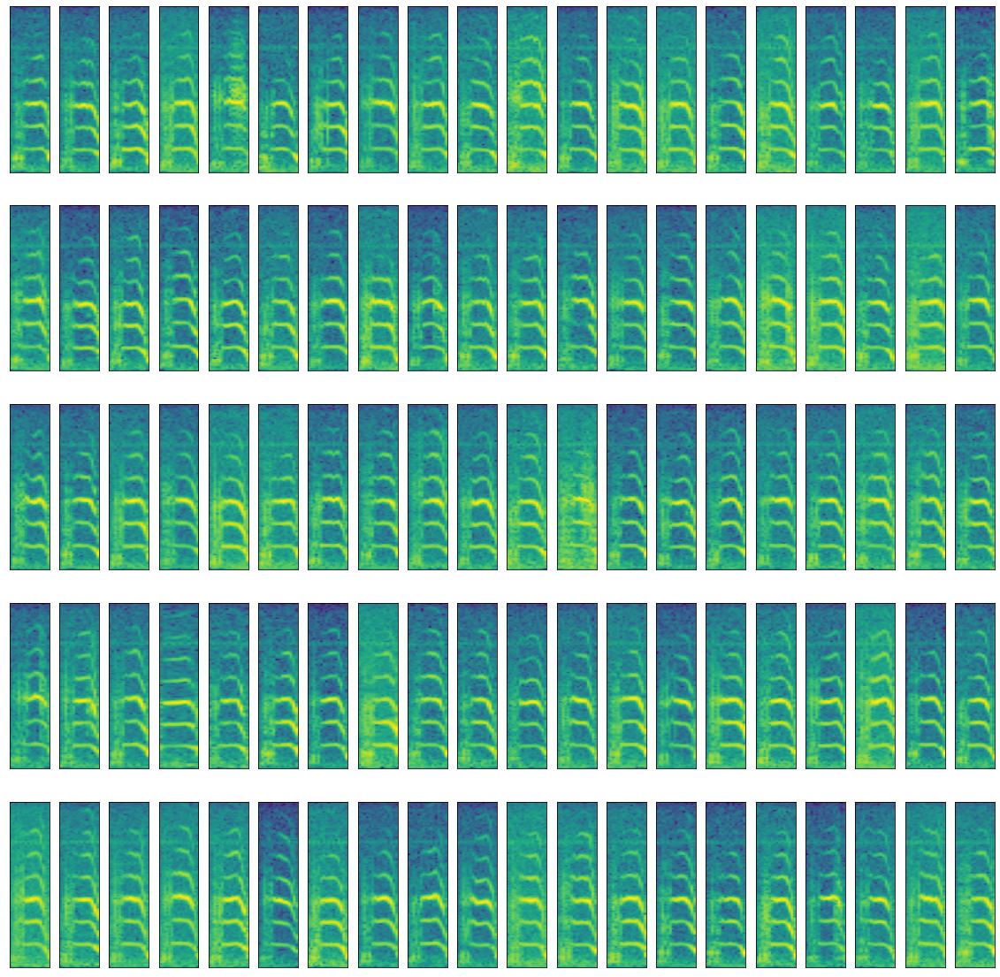

In [106]:
cond = (y<-40) & (x>30) 
g = get_group(cond)
plot_group(g, save_path, 'g2')

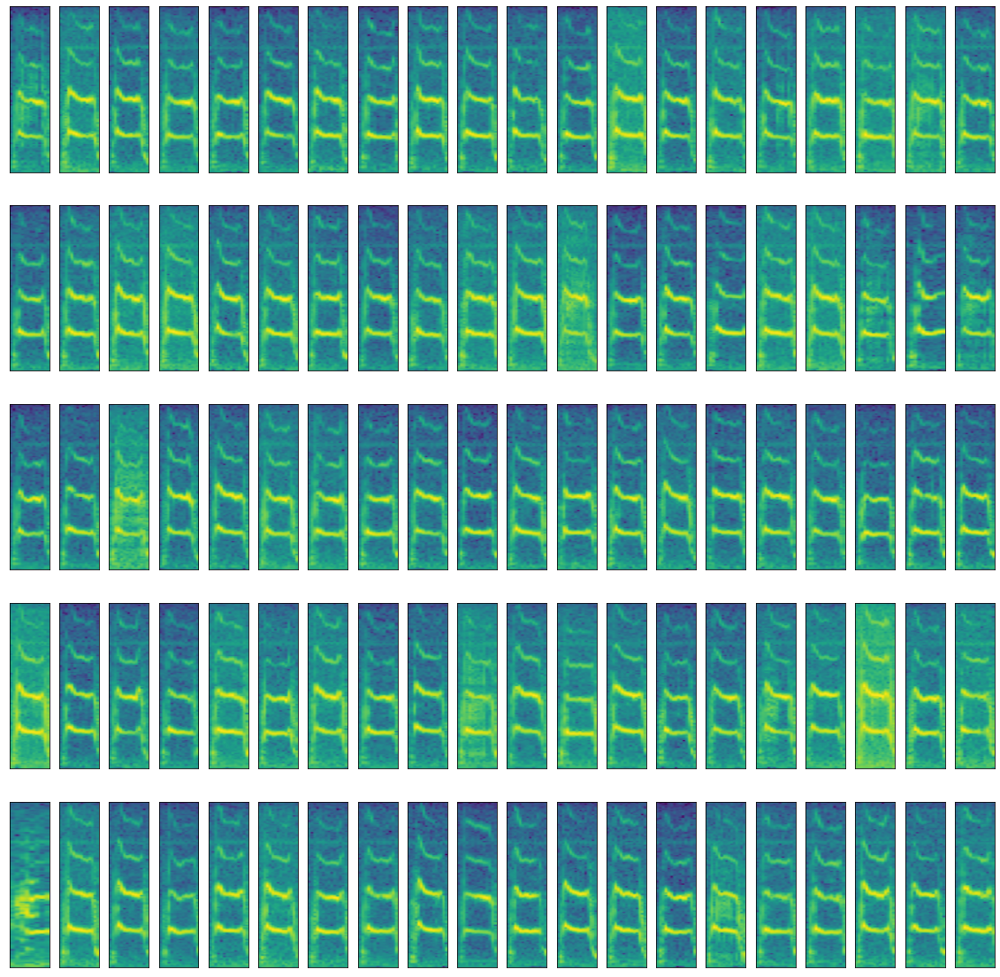

In [108]:
cond = (y<10) &(y  > -20) & (x>60) 
g = get_group(cond)
plot_group(g, save_path, 'g3')

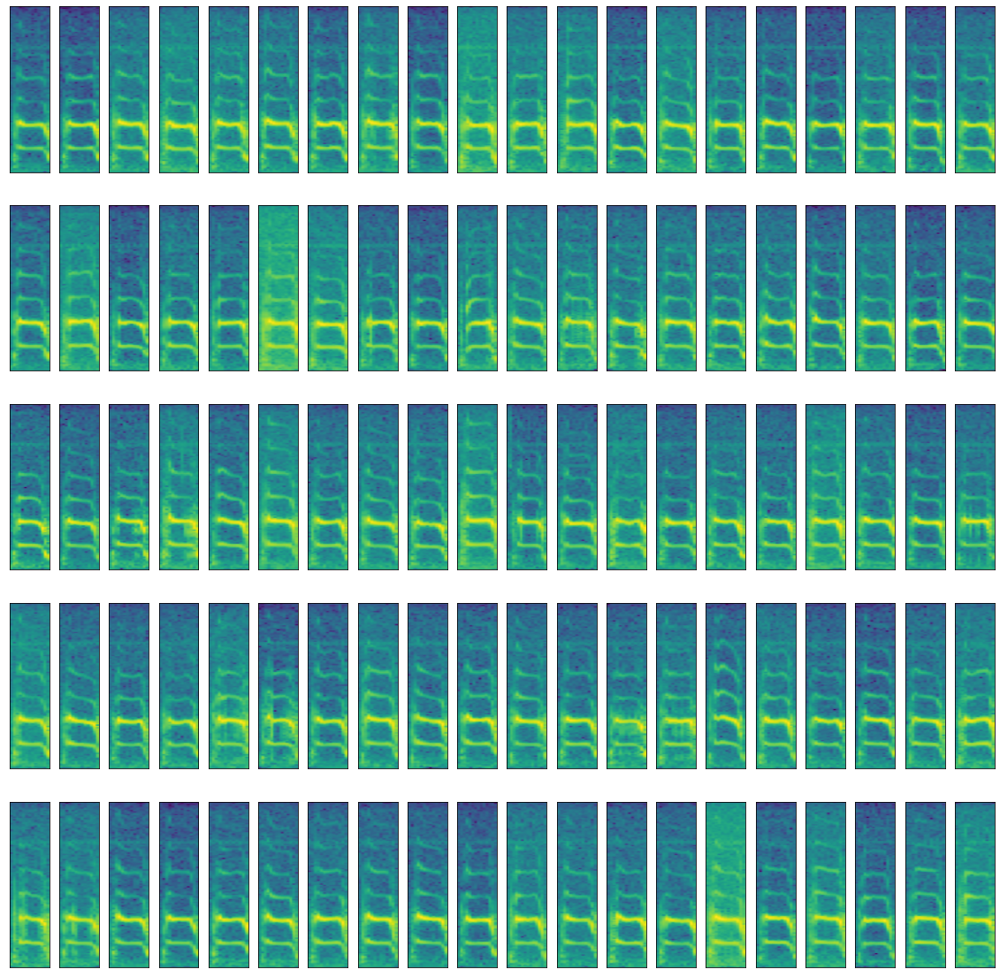

In [59]:
plot_group(g2, 'g2')

In [33]:
g3_mask = ((tsne_val[:,0] < -2) & (tsne_val[:,1] > 3 ))
g3 = x_test[g3_mask]
g3.shape

(535, 200, 48, 3)

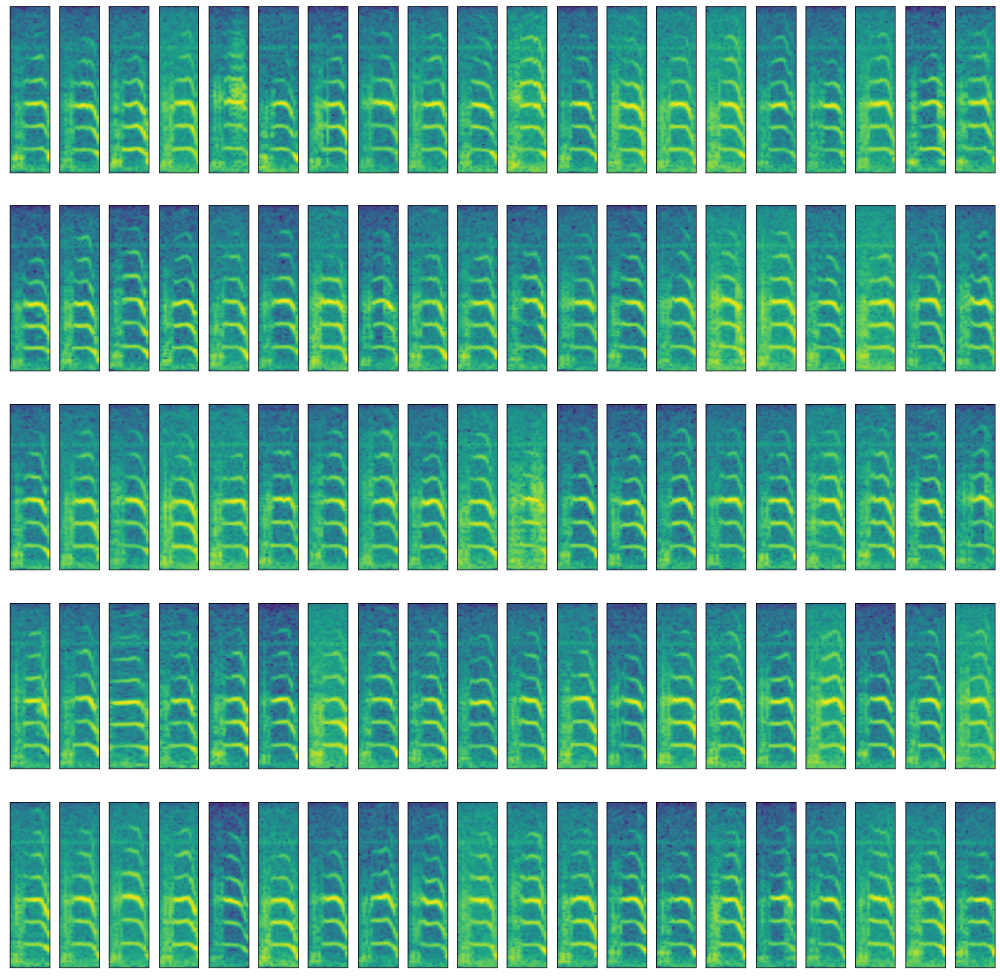

In [61]:
plot_group(g3, 'g3')

In [64]:
g4_mask = ((tsne_val[:,1] < -4) & (tsne_val[:,0] > 2 ))
g4 = x_test[g4_mask]
g4.shape

(227, 200, 48, 3)

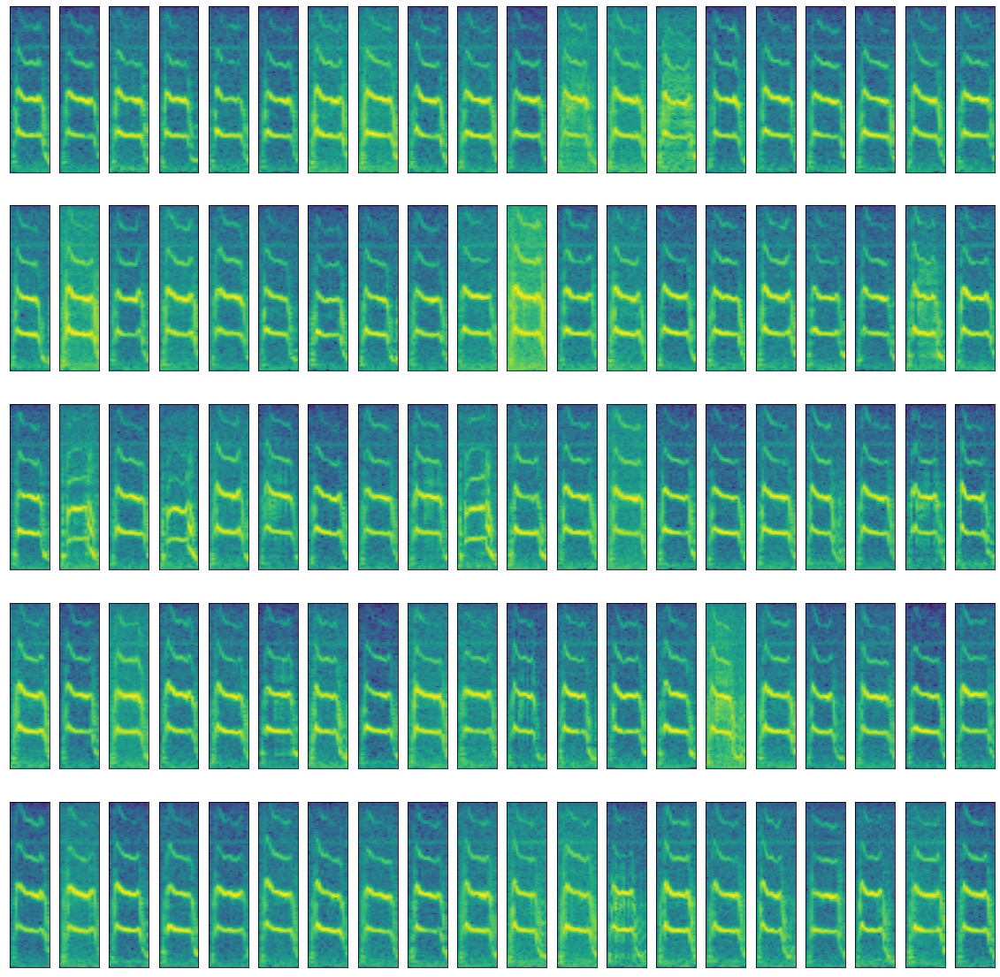

In [65]:
plot_group(g4,'g4')

In [93]:
def plot_rec(idx):
    fig = plt.figure(figsize=(4,8))

    plt.subplot(1,2,1)
    plt.xticks([])
    plt.yticks([])
    plt.title('Original')
    plt.imshow(x_test[idx])

    plt.subplot(1,2,2)
    plt.xticks([])
    plt.yticks([])
    plt.title('Reconstructed')
    plt.imshow(x_pred[idx])
    plt.show()
    
def plot_scatter(data, mode=1):
    
    plt.figure()
    plt.figure(figsize=(30,30))
    ax = plt.subplot()
    
    x = data[:,0]
    y = data[:,1]
    
    xmin = min(x)-0.5
    xmax = max(x)+0.5
    ymin = min(y)-0.5
    ymax = max(y)+0.5
    print(xmin, xmax, ymin, ymax)
    plt.axis((xmin, xmax, ymin, ymax))

    plt.scatter(x,y, color = 'b')
    plt.savefig('%s/scatter'%(save_path))

    plt.show()
    
def plot_group(group_data, save_path, file_name):
    
    x, y = 5, 20
    fig = plt.figure(figsize=(20,20))
    for i in range(x):
        for j in range(y):
            idx = i*y+j
            plt.subplot(x, y, idx+1)
            plt.xticks([])
            plt.yticks([])
            plt.imshow(group_data[idx])
            
    plt.savefig('%s/%s'%(save_path, file_name))
    plt.show() 